In [1]:
! pip install pytorch_lightning 

In [2]:
from torch.utils.data import Dataset, DataLoader
from typing import Any, Callable, List, Tuple
import pytorch_lightning as pl

import torch
import numpy as np
import albumentations as albu
import torchvision
import matplotlib.pyplot as plt
import pytorch_lightning as pl
import os
from matplotlib.pyplot import imshow
from PIL import Image
import random


import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.utils.data as data
import torchvision
from torchvision import transforms
from torchvision.io import read_image
import torchvision.transforms as T
import torchmetrics
# import albumentations

from sklearn import preprocessing
from sklearn import model_selection
from sklearn import metrics

import numpy as np
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 500
import matplotlib.image as mpimg
import pandas as pd

import os
import glob
from os import path
from pathlib import Path
from tqdm import tqdm

import cv2
from PIL import Image, ImageFile

from torchvision.utils import make_grid

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
device

device(type='cuda')

In [5]:
# import multiprocessing as mp
# mp.set_start_method('spawn', force=True)


In [6]:
class ImageData(Dataset):
    def __init__(self):
        self.path = '/kaggle/input/qr-codes/qr_dataset'
        self.names = os.listdir(self.path)
        
    def __len__(self):
        return len(self.names)
    
    def __getitem__(self, item):
        image = Image.open(os.path.join(self.path, self.names[item])).convert("1")
        image = transforms.Resize((64, 64))(image)
        #image = np.array(image)
        image = torch.Tensor(np.array(image)).view(1, 64, 64)
        image = np.array(image)

        return image

(64, 64, 3)


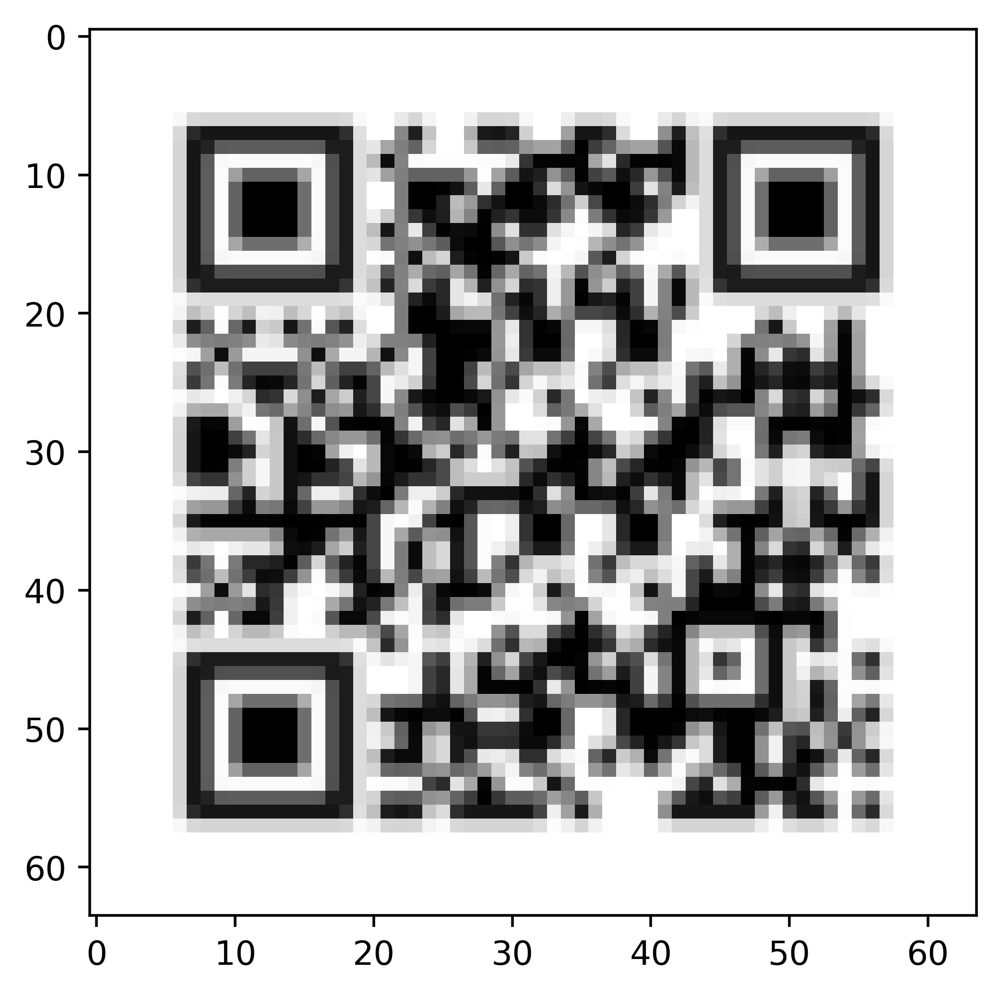

In [56]:
image = Image.open('/kaggle/input/qr-codes/qr_dataset/4007-v3.png')
image = np.array(transforms.Resize((64, 64))(image))
print(image.shape)
plt.imshow(image)

In [91]:
i = ImageData()

img = i.__getitem__(1)
print(img.shape)

(1, 64, 64)


4007-v3.png


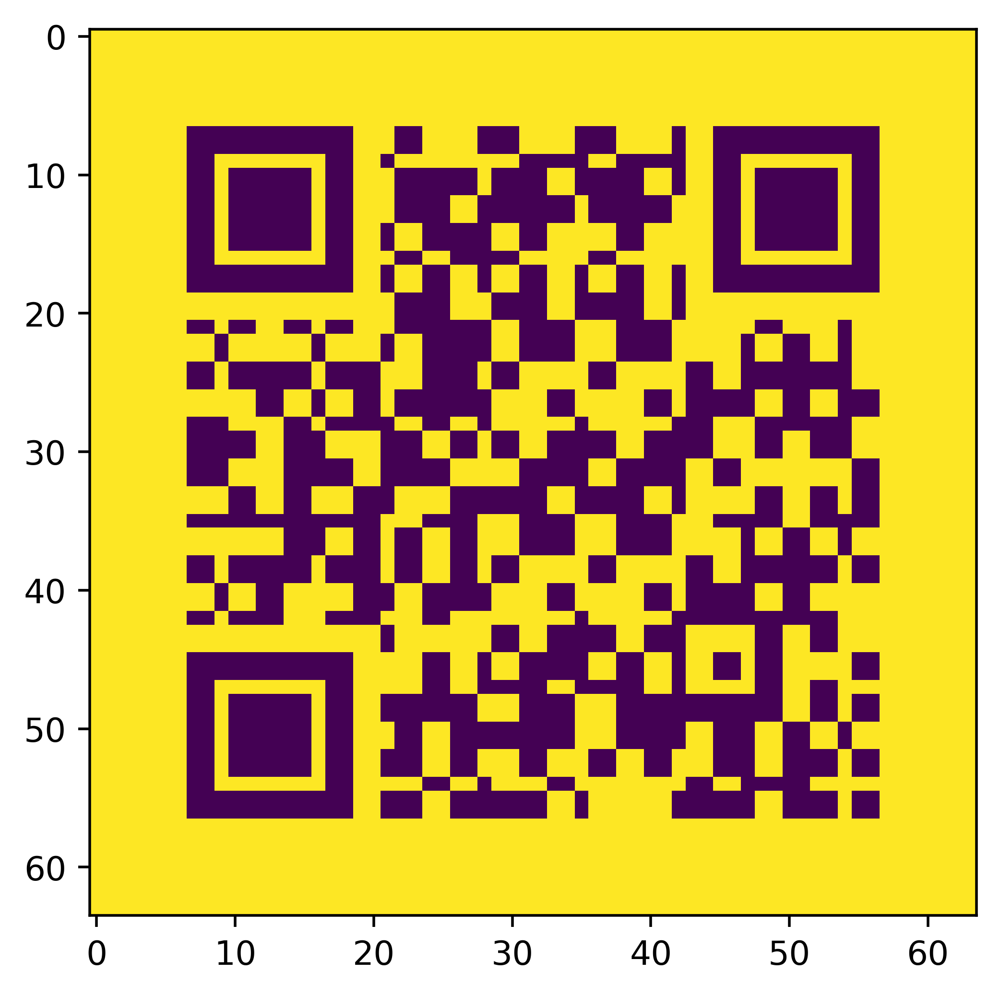

In [57]:
i = ImageData()

img = i.__getitem__(1)
plt.imshow(np.array(img))

In [43]:
# o = (i-1) * s + k -2p

In [44]:
# o = (i + 2p - k)/s + 1

In [7]:
def xent(logits, is_real, smooth=0.2):
    probs = torch.sigmoid(logits)
    label = 1 - smooth if is_real else smooth
    labels = torch.full_like(probs, label)
    return torch.nn.functional.binary_cross_entropy(probs, labels, reduction="none")


def mse(logits, is_real):
    return (logits - is_real).square()


def relu(logits, is_real):
    if is_real:
        return torch.clip(1 - logits, min=0)
    else:
        return torch.clip(logits, min=0)
    
    
criterion = relu

# logits = torch.linspace(-1, 2, 100)
# plt.plot(logits, criterion(logits, 1), label="Real")
# plt.plot(logits, criterion(logits, 0), label="Fake")
# plt.legend()
# plt.show()

In [8]:
#l = -(y * log(x) + (1 - y) * log(1 - x))

In [9]:
class Discriminator(nn.Module):
    def __init__(self, ch_dim = 1, feat = 64):
        super().__init__()
        self.main = nn.Sequential(
          self.block(ch_dim, feat, 4, 2, 1),
          self.block(feat, feat*2, 4, 2, 1),
          self.block(feat * 2, feat * 4, 4, 2, 1),
          self.block(feat * 4, feat * 8, 4, 2, 1), 
          nn.Conv2d(feat * 8, 1, 4, 2, 0), 
#           nn.Sigmoid()
        )

    def block(self, in_ch, out_ch, ker, stride, pad):
      return nn.Sequential(
          nn.Conv2d(in_ch, out_ch, ker, stride, pad, bias=False),
          nn.BatchNorm2d(out_ch),
          nn.LeakyReLU(0.2, inplace=True),
    )  
    
    def forward(self, input):
        return self.main(input)


In [10]:
class Generator(nn.Module):
  def __init__(self, z_dim = 100, feat = 64):
    super().__init__()
    self.main = nn.Sequential(
        #input N * z_dim * 1 * 1
        self.block(z_dim, feat * 16, 4, 1, 0), # 1024
        self.block(feat * 16, feat * 8, 4, 2, 1), #512
        self.block(feat * 8, feat * 4, 4, 2, 1), #256
        self.block(feat * 4, feat * 2, 4, 2, 1), #128
        nn.ConvTranspose2d(feat * 2, 1, 4, 2, 1, bias=False), #3
        nn.Tanh()
    )

  def block(self, in_ch, out_ch, ker, stride, pad):
    return nn.Sequential(
        nn.ConvTranspose2d(in_ch, out_ch, ker, stride, pad, bias=False),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(True),
    )
  
  def forward(self, input):
    return self.main(input)



In [86]:
g = Generator(100, 64)

noise = torch.randn(1, 100, 1, 1)
images = g(noise)

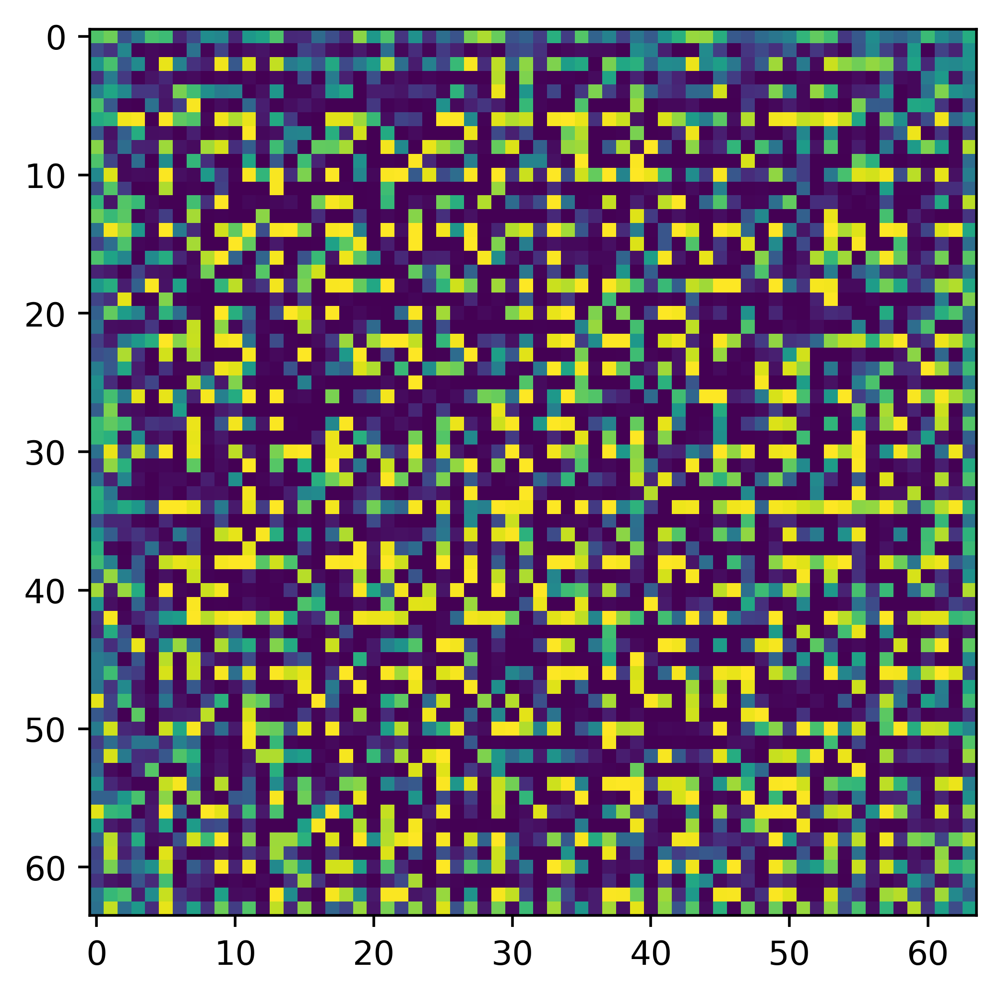

In [87]:
plt.imshow(images.view(1, 64, 64).permute(1, 2, 0).detach().numpy())

Training: 0it [00:00, ?it/s]

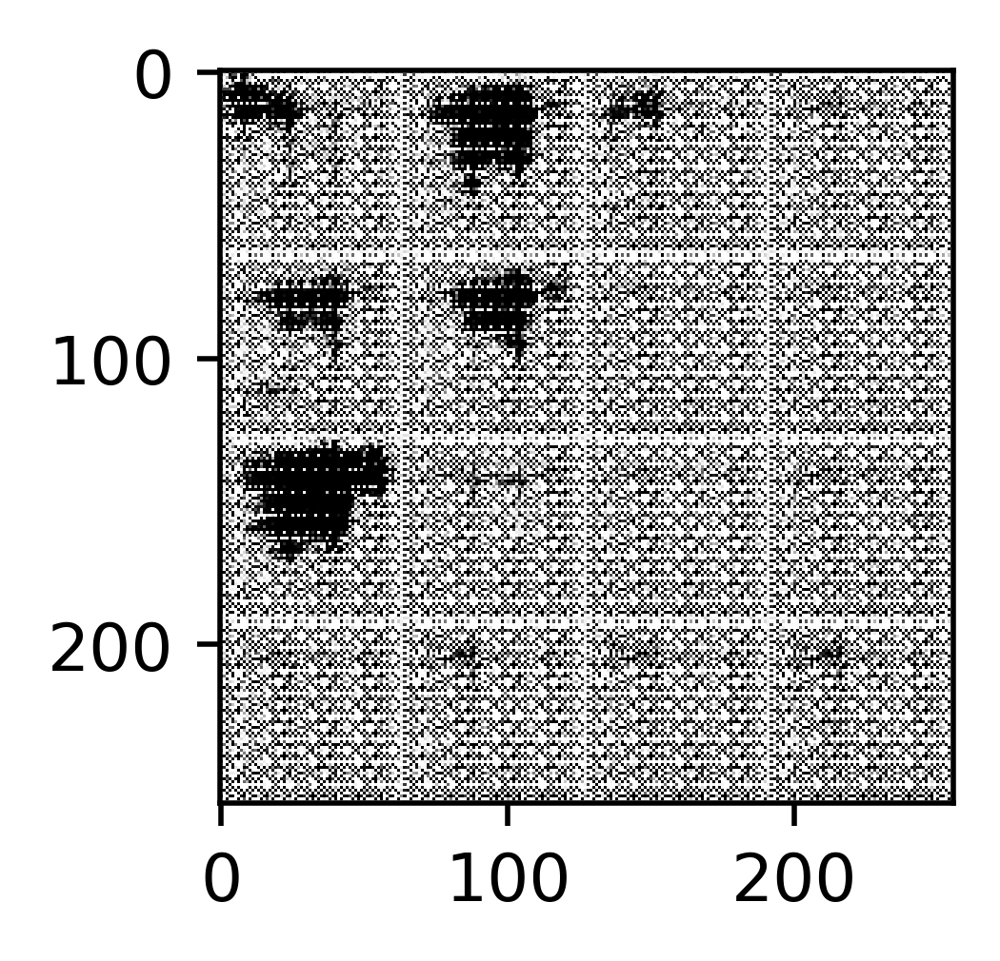

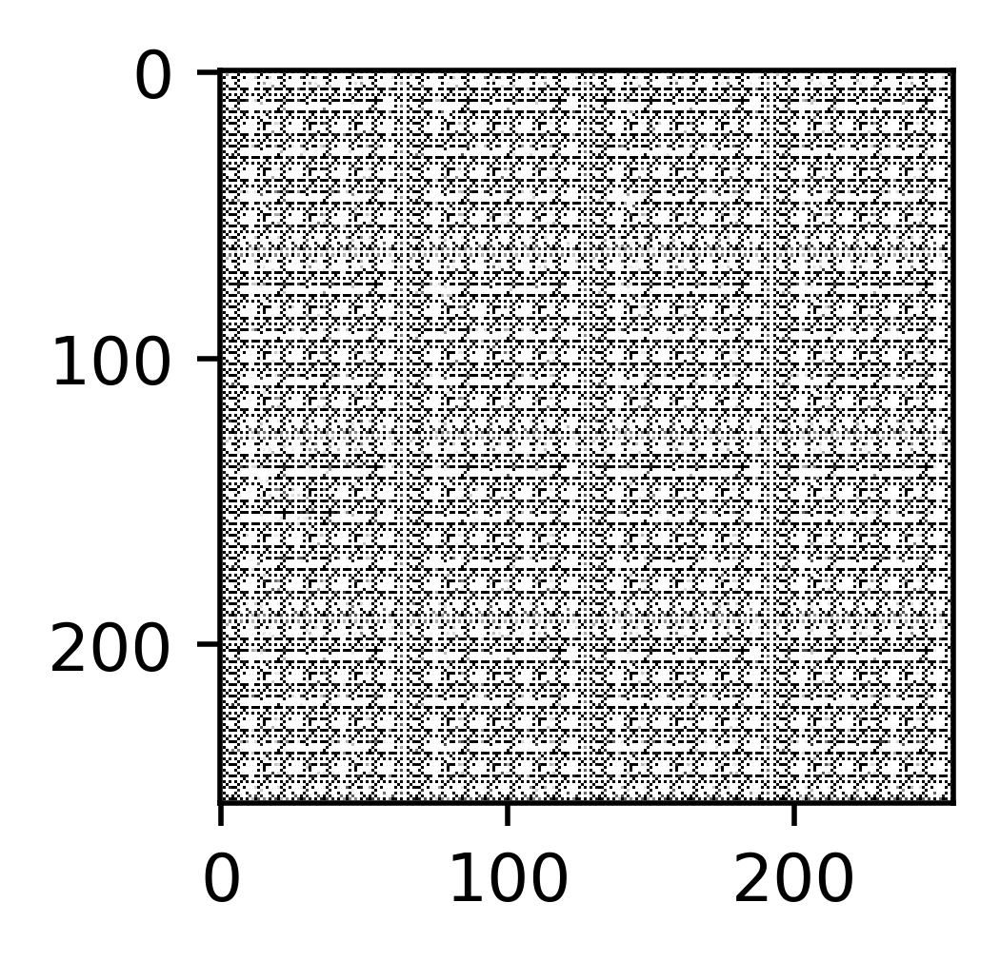

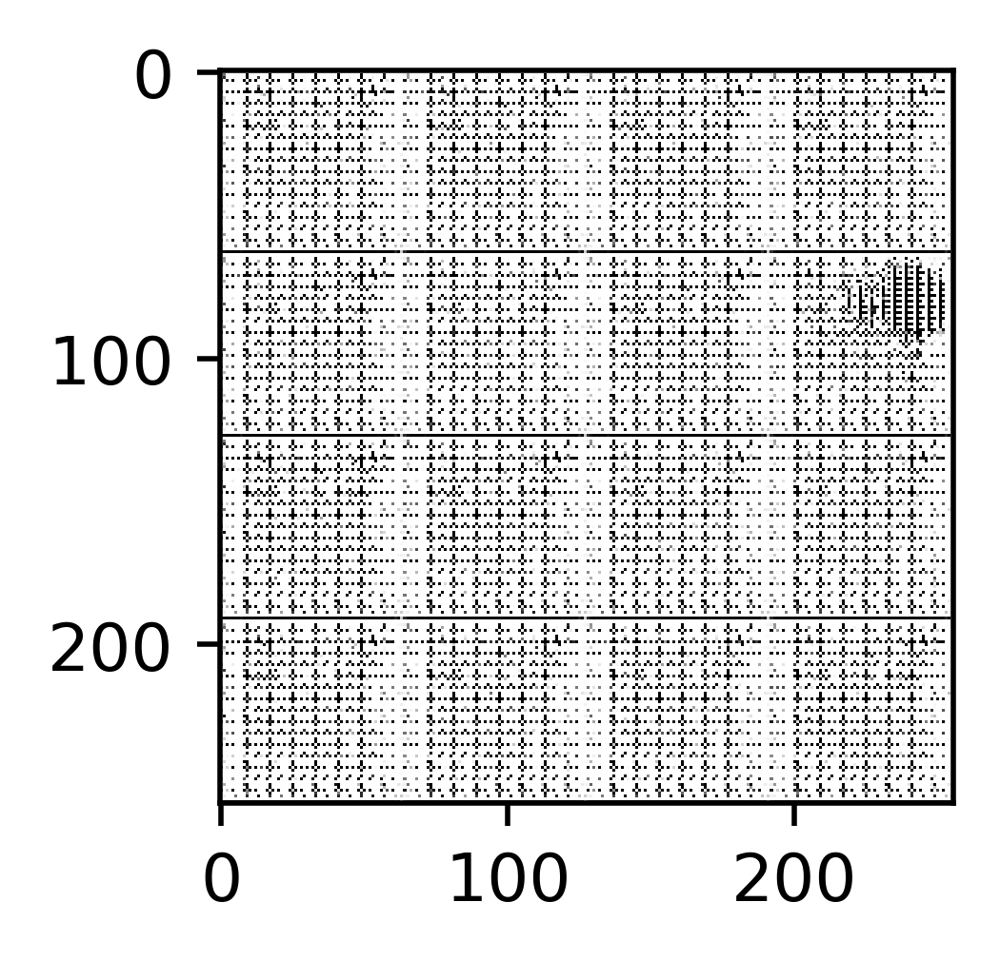

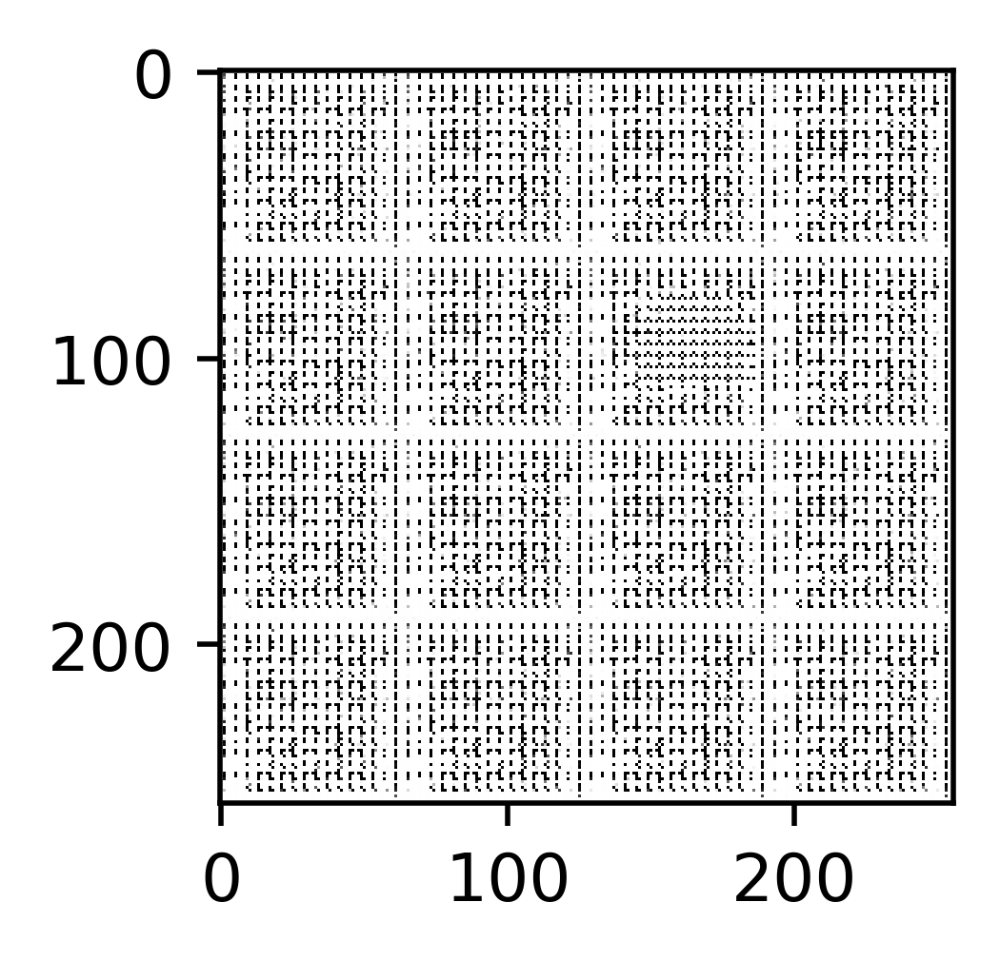

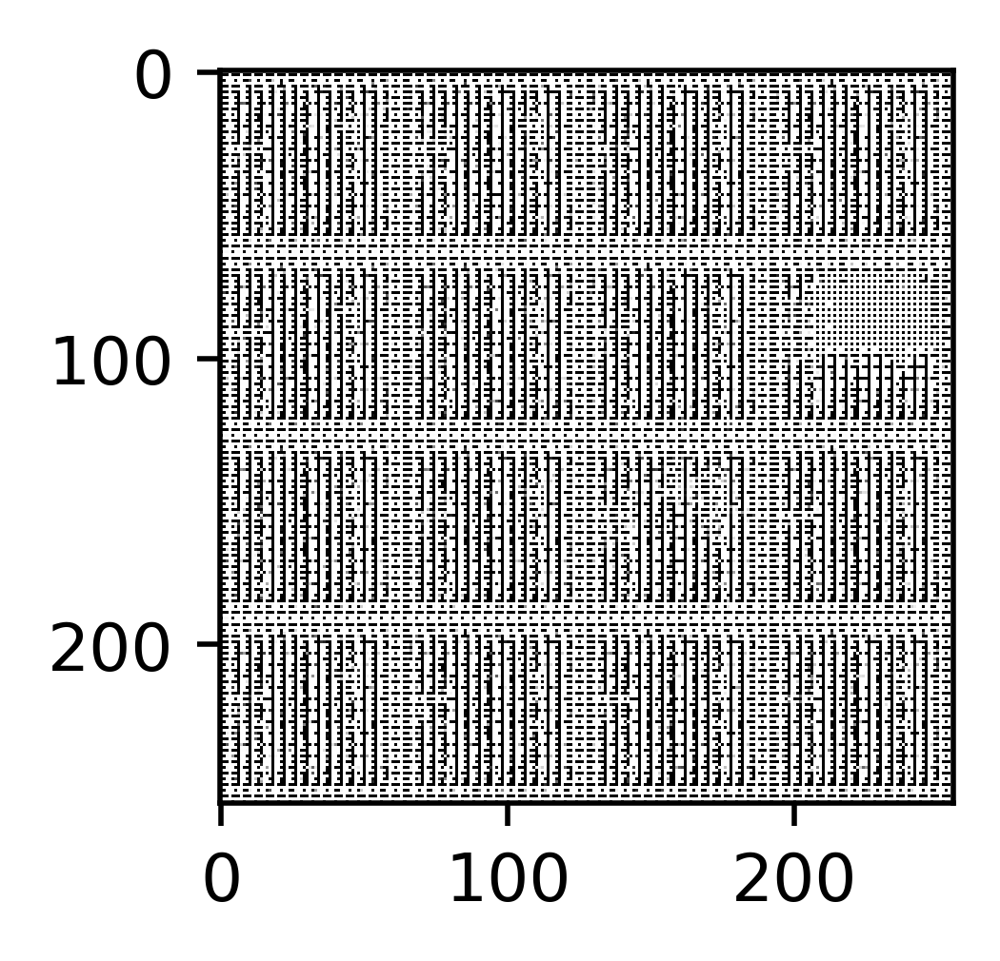

...

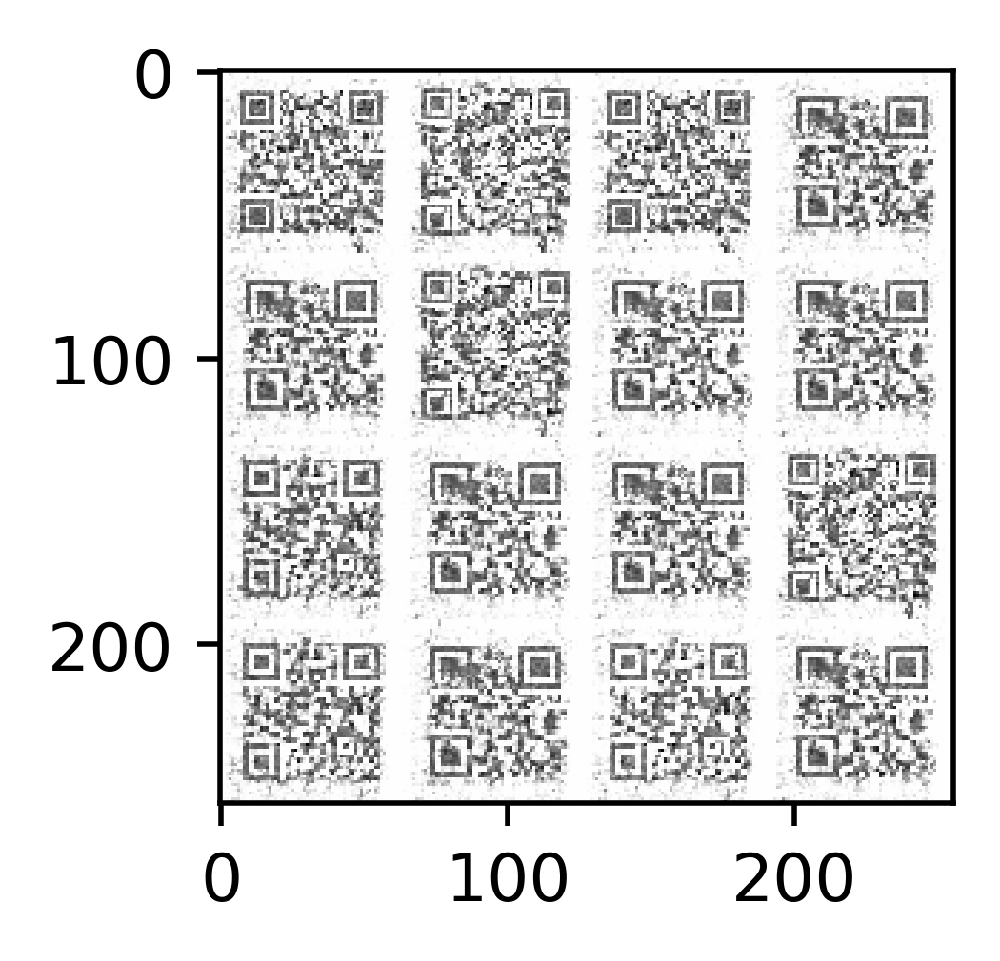

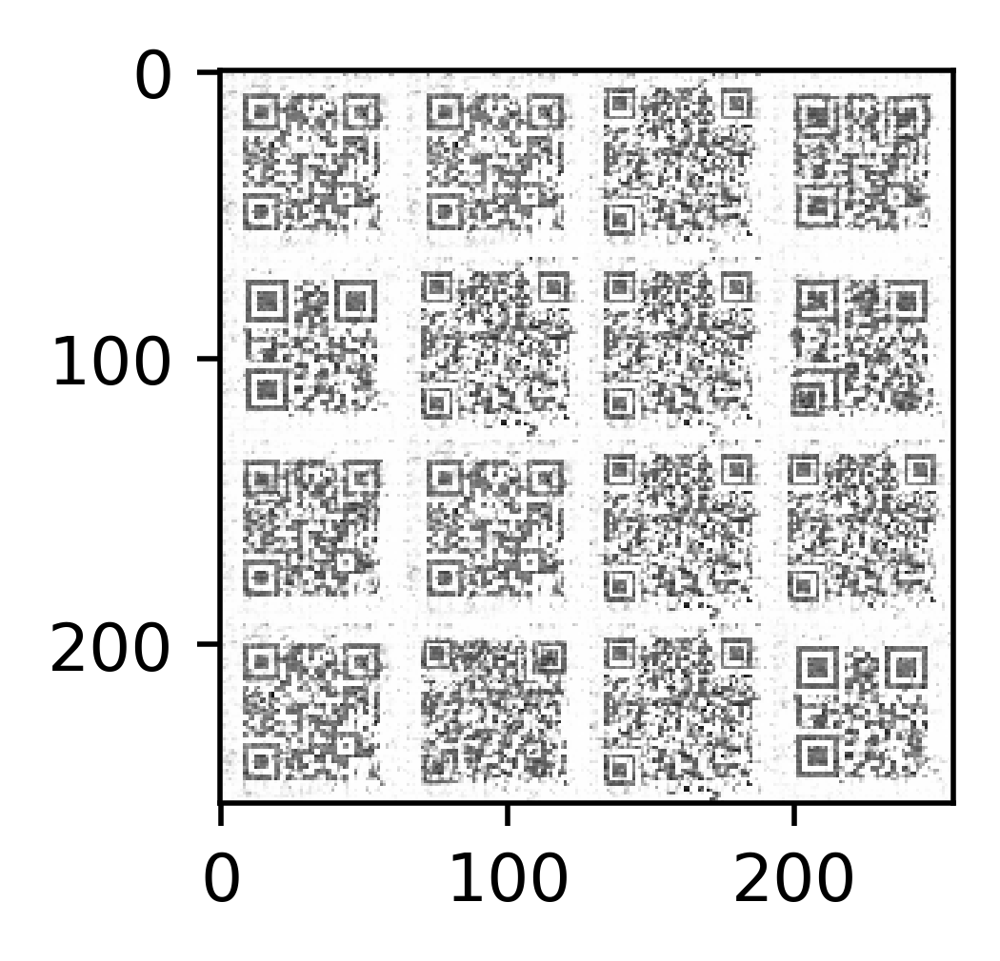

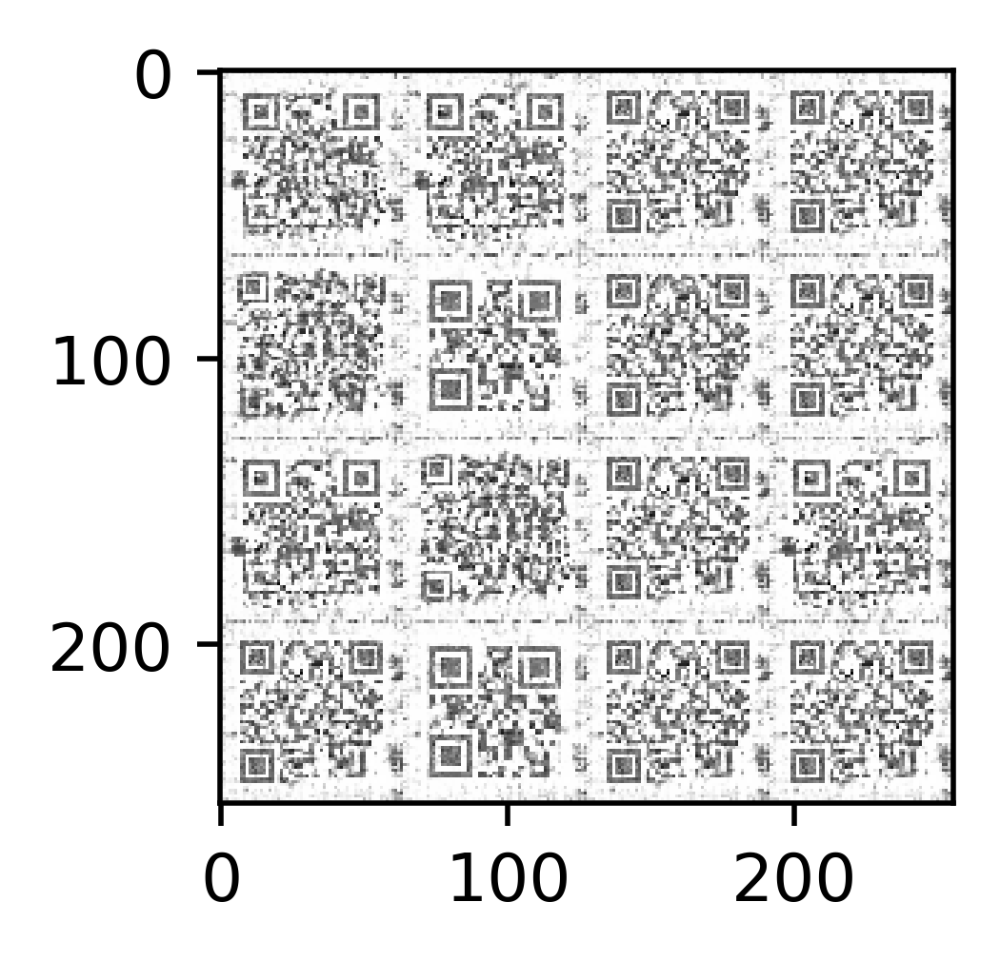

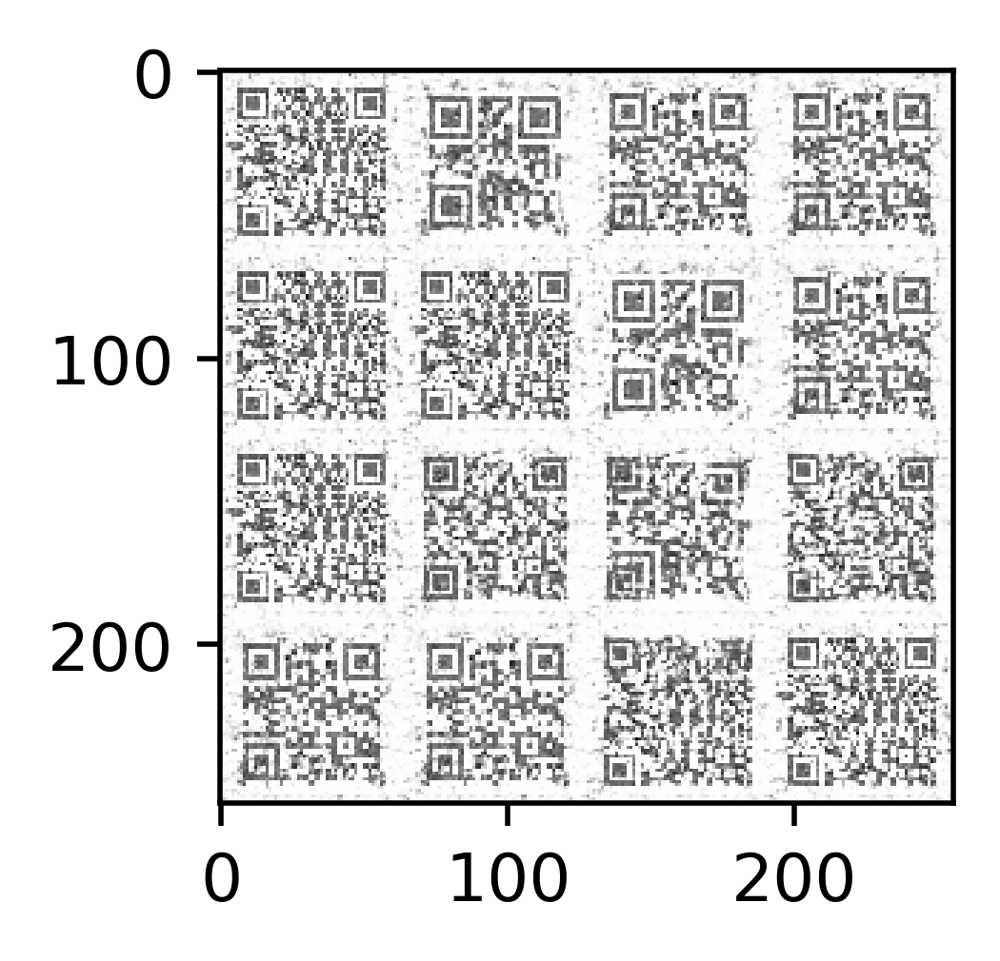

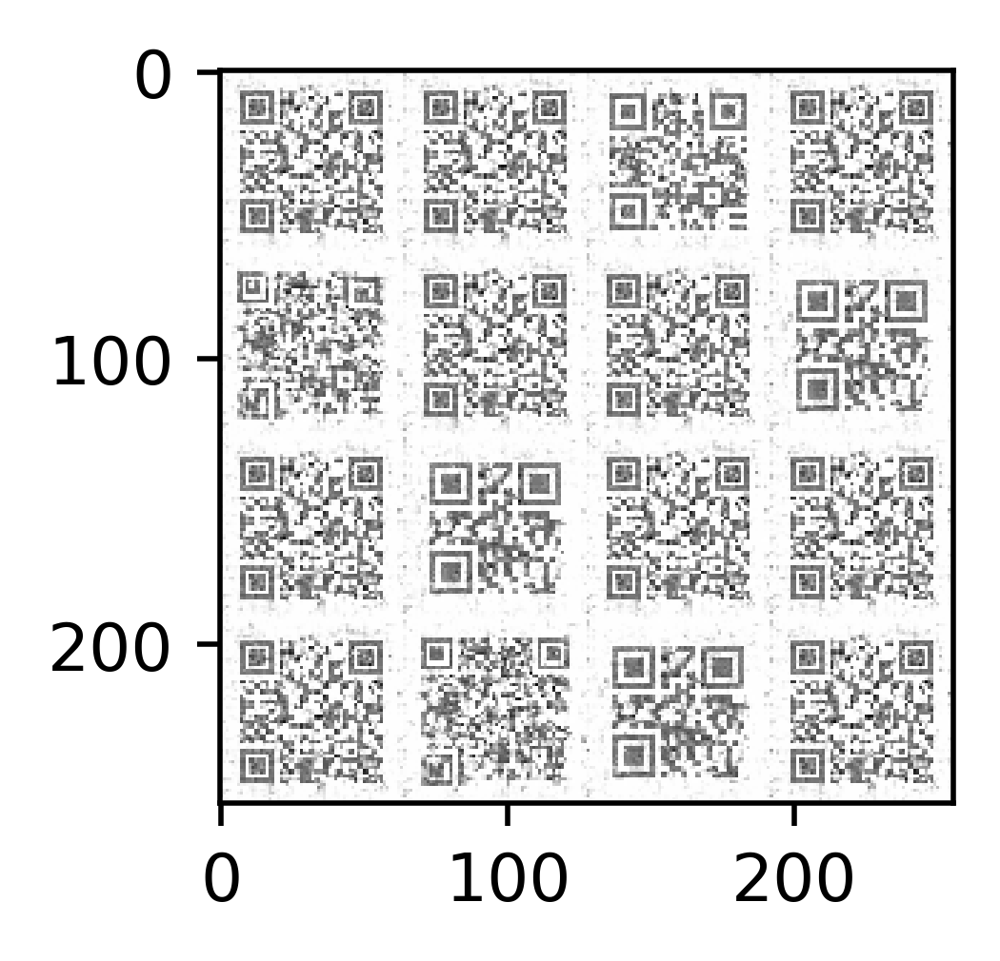

In [11]:
from skimage.io import imsave

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)
        

class Module(pl.LightningModule):
    def __init__(self):
        super().__init__()
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(0.5, 0.5)
        ])
        self._dataset = ImageData()
        self._generator =Generator(100, 64)
        self._discriminator = Discriminator(1, 64)
        self._generator.apply(weights_init)
        self._discriminator.apply(weights_init)
        
    def forward(self, batch_size, detach_generator=False):
        noise = torch.randn(batch_size, 100, 1, 1, device = device)
        images = self._generator(noise)
        if detach_generator:
            images = images.detach()
        logits = self._discriminator(images)
        return images, logits
    
    def training_step(self, batch, batch_idx, optimizer_idx=0):
        noise = torch.randn(len(batch), 100, 1, 1, device = device)
        fake = self._generator(noise)
        
        if optimizer_idx == 0:
            loss = criterion(self._discriminator(fake), 1).mean()
            
            self.log("g_loss", loss, prog_bar=True)
        if optimizer_idx == 1:
            real_loss = criterion(self._discriminator(batch), 1).mean()

            fake_loss = criterion(self._discriminator(fake.detach()), 0).mean()

            self.log("d_r_loss", real_loss, prog_bar=True)
            self.log("d_f_loss", fake_loss, prog_bar=True)
            loss = real_loss + fake_loss
        
        return loss
        
    def configure_optimizers(self):
        g_optimizer = torch.optim.Adam(self._generator.parameters(),
                                       lr=0.01, betas=(0.5, 0.999))
        d_optimizer = torch.optim.Adam(self._discriminator.parameters(),
                                       lr=0.01, betas=(0.5, 0.999))
        return [g_optimizer, d_optimizer], []
        
    def train_dataloader(self):
        loader = torch.utils.data.DataLoader(self._dataset, batch_size=128,
                                             shuffle=True, drop_last=True)
        return loader
    
    def on_train_epoch_end(self):
        with torch.no_grad():
            generated, _ = self(16)
            grid = make_grid(generated, padding=0, normalize=True, nrow=4)
        image = (grid.permute(1, 2, 0).to('cpu').numpy() * 255).astype(np.uint8)
        imsave("grid.jpg", image)
        
        fig, ax = plt.subplots()

        ax.imshow(image)

        fig.set_figwidth(2)    #  ширина и
        fig.set_figheight(2)    #  высота "Figure"

        plt.show()
        
#         plt.imshow(image)
#         plt.show()

    
def train(module):
    pl.seed_everything(0)
    trainer = pl.Trainer(default_root_dir='', accelerator="auto", max_epochs=100)
    trainer.fit(module)

    
module = Module()
train(module)

Dataset
